# Enhanced Correlation Coefficient Image Alignment (ECC) in OpenCV

https://learnopencv.com/image-alignment-ecc-in-opencv-c-python/ 

The **ECC** image alignment algorithm introduced in OpenCV 3 is based on a 2008 paper titled **Parametric Image Alignment using Enhanced Correlation Coefficient Maximization** by Georgios D. Evangelidis and Emmanouil Z. Psarakis. They propose using a new similarity measure called Enhanced Correlation Coefficient (ECC) for estimating the parameters of the motion model. There are two advantages of using their approach.

- Unlike the traditional similarity measure of difference in pixel intensities, ECC is invariant to photometric distortions in contrast and brightness.
- Although the objective function is nonlinear function of the parameters, the iterative scheme they develop to solve the optimization problem is linear. In other words, they took a problem that looks computationally expensive on the surface and found a simpler way to solve it iteratively.

In [67]:
from __future__ import print_function
import cv2
import numpy as np
from matplotlib import pyplot as plt
import time

In [68]:
f1 = "D:\imageData\LaserClean\Fiducial-pre.tif"
f2  = "D:\imageData\LaserClean\Fiducial-post.tif"

## Read in two images to align

In [69]:
im1 = cv2.imread('D:\imageData\LaserClean\im1_scaled.tiff', cv2.IMREAD_COLOR) 
im2 = cv2.imread('D:\imageData\LaserClean\im2_scaled.tiff', cv2.IMREAD_COLOR) 

im1 = cv2.imread('D:\imageData\LaserClean\Raw-pre_scaled.tiff', cv2.IMREAD_COLOR) 
im2 = cv2.imread('D:\imageData\LaserClean\Raw-post_scaled.tiff', cv2.IMREAD_COLOR) 

# Convert images to grayscale
im1_gray = cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)
im2_gray = cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

## Configure the run

In [70]:
# Specify the number of iterations, and the increment in the correlation coefficient between iterations
number_of_iterations = 10;
termination_eps = 1e-10;

# Define termination criteria
criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, number_of_iterations,  termination_eps)

# Define the motion model
warp_mode = cv2.MOTION_TRANSLATION
#warp_mode = cv2.MOTION_HOMOGRAPHY   # slower by 3-4x

## Perform the registration

In [71]:
start = time.time()
print("Start: Number of iterations = ",number_of_iterations )


# Find size of image1
sz = im1.shape

# Define 2x3 or 3x3 matrices and initialize the matrix to identity
if warp_mode == cv2.MOTION_HOMOGRAPHY :
    warp_matrix = np.eye(3, 3, dtype=np.float32)
else :
    warp_matrix = np.eye(2, 3, dtype=np.float32)


# Run the ECC algorithm. The results are stored in warp_matrix.
(cc, warp_matrix) = cv2.findTransformECC (im1_gray,im2_gray,warp_matrix, warp_mode, criteria)


if warp_mode == cv2.MOTION_HOMOGRAPHY :
    # Use warpPerspective for Homography
    im2_aligned = cv2.warpPerspective (im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)
else :
    # Use warpAffine for Translation, Euclidean and Affine
    im2_aligned = cv2.warpAffine(im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP);

# Write aligned image to disk. 
outFilename = "D:\imageData\LaserClean\Raw-post_scaled_aligned.tiff"
cv2.imwrite(outFilename, im2_aligned)

end = time.time()
print("Elapsed time (sec): %5.1f" % (end - start))


Start: Number of iterations =  10
Elapsed time (sec):  10.5


<Figure size 432x288 with 0 Axes>

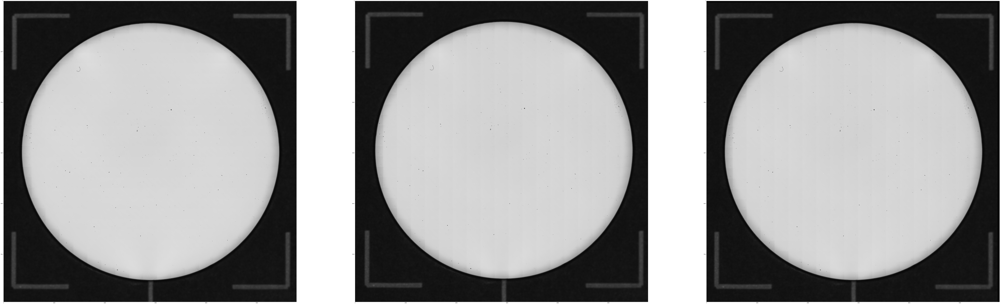

In [72]:
%matplotlib inline

plt.figure()

#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(1,3, figsize=(200,100)) 

# use the created array to output your multiple images. 
axarr[0].imshow(im1)
axarr[1].imshow(im2)
axarr[2].imshow(im2_aligned)


## Motion models in OpenCV
In a typical image alignment problem we have two images of a scene, and they are related by a motion model. Different image alignment algorithms aim to estimate the parameters of these motion models using different tricks and assumptions. Once these parameters are known, warping one image so that it aligns with the other is straight forward.

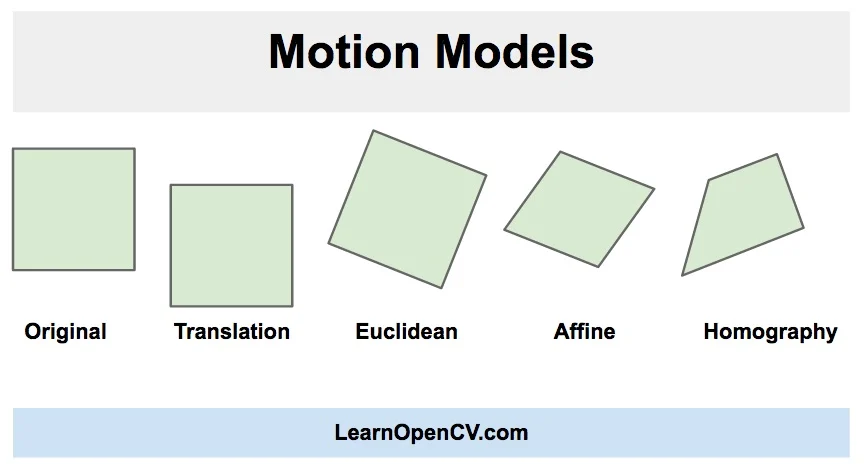

The OpenCV constants that represent these models have a prefix MOTION_ and are shown inside the brackets.

- **Translation ( MOTION_TRANSLATION ) :** The first image can be shifted ( translated ) by (x , y) to obtain the second image. There are only two parameters x and y that we need to estimate.
- **Euclidean ( MOTION_EUCLIDEAN ) :** The first image is a rotated and shifted version of the second image. So there are three parameters — x, y and angle . You will notice in Figure 4, when a square undergoes Euclidean transformation, the size does not change, parallel lines remain parallel, and right angles remain unchanged after transformation.
- **Affine ( MOTION_AFFINE ) :** An affine transform is a combination of rotation, translation ( shift ), scale, and shear. This transform has six parameters. When a square undergoes an Affine transformation, parallel lines remain parallel, but lines meeting at right angles no longer remain orthogonal.
- **Homography ( MOTION_HOMOGRAPHY ) :** All the transforms described above are 2D transforms. They do not account for 3D effects. A homography transform on the other hand can account for some 3D effects ( but not all ). This transform has 8 parameters. A square when transformed using a Homography can change to any quadrilateral.

In OpenCV an Affine transform is stored in a 2 x 3 sized matrix. Translation and Euclidean transforms are special cases of the Affine transform. In Translation, the rotation, scale and shear parameters are zero, while in a Euclidean transform the scale and shear parameters are zero. So Translation and Euclidean transforms are also stored in a 2 x 3 matrix. Once this matrix is estimated ( as we shall see in the next section ), the images can be brought into alignment using the function warpAffine.

Homography, on the other hand, is stored in a 3 x 3 matrix. Once the Homography is estimated, the images can be brought into alignment using warpPerspective.

# Utility to resize input images prior to run

In [66]:
f1 = 'D:\imageData\LaserClean\Raw-pre.tif'
f2 = 'D:\imageData\LaserClean\Raw-post.tif'

size_ratio = 0.2

im1 = cv2.imread(f1, cv2.IMREAD_COLOR) 

im1 = cv2.resize( im1, # original image
                   (0,0), # set fx and fy, not the final size
                   fx=size_ratio, 
                   fy=size_ratio,
                   interpolation=cv2.INTER_NEAREST)

outFilename = "D:\imageData\LaserClean\Raw-pre_scaled.tiff"
cv2.imwrite(outFilename, im1)
print("read in and resized im1")


im2 = cv2.imread(f2, cv2.IMREAD_COLOR) 
im2 = cv2.resize( im2, # original image
                   (0,0), # set fx and fy, not the final size
                   fx=size_ratio, 
                   fy=size_ratio,
                   interpolation=cv2.INTER_NEAREST)

outFilename = "D:\imageData\LaserClean\Raw-post_scaled.tiff"
cv2.imwrite(outFilename, im2)
print("read in and resized im2")

read in and resized im1
read in and resized im2
